# **CASSAVA LEAF DISEASE CLASSIFICATION**

# Importing the Necessary Libraries 

In [46]:
import json
import os 

import numpy as np 
import pandas as pd 
import tensorflow as tf 
import seaborn as sns
import matplotlib.pyplot as plt
import cv2

import gc
import dask.array as da
import dask
import h5py

import zipfile
import matplotlib
from imutils import paths
import sys
import matplotlib.image as mpimg
from google.colab.patches import cv2_imshow
from glob import glob 
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from collections import Counter
#Keras
from tensorflow.keras.utils import to_categorical # convert to one-hot-encoding
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import load_model
from keras import layers
from keras import Model
from keras.applications.inception_v3 import InceptionV3, preprocess_input
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, LearningRateScheduler, ModelCheckpoint
from keras import backend as K
#sklearn helpers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import preprocessing
import random

# Initializing the File-Directories

In [2]:
cassava_train_dir = "/kaggle/input/cassava-leaf-disease-classification/train_test_val/Without_Sampeling/TRAIN"
cassava_test_dir = "/kaggle/input/cassava-leaf-disease-classification/train_test_val/Without_Sampeling/TEST"
cassava_val_dir = "/kaggle/input/cassava-leaf-disease-classification/train_test_val/Without_Sampeling/VALIDATION"
jsonfile_dir = "/kaggle/input/cassava-leaf-disease-classification/Actual_Dataset/label_num_to_disease_map.json"
train_csv_dir = "/kaggle/input/cassava-leaf-disease-classification/Actual_Dataset/train.csv"

In [109]:
train_dir = '/kaggle/input/cassava-leaf-disease-classification/train_test_val/Without_Sampeling/TRAIN'
valid_dir = '/kaggle/input/cassava-leaf-disease-classification/train_test_val/Without_Sampeling/VALIDATION'
test_dir = '/kaggle/input/cassava-leaf-disease-classification/train_test_val/Without_Sampeling/TEST'

# Reading the JSon File

In [3]:
with open(jsonfile_dir) as file:
    mapped_classes = json.loads(file.read())

print(json.dumps(mapped_classes,indent=2))

{
  "0": "Cassava Bacterial Blight (CBB)",
  "1": "Cassava Brown Streak Disease (CBSD)",
  "2": "Cassava Green Mottle (CGM)",
  "3": "Cassava Mosaic Disease (CMD)",
  "4": "Healthy"
}


# Creating Dataframe for Training

In [4]:
train_class_labels = []

for item in os.listdir(cassava_train_dir):
    all_images = os.listdir(cassava_train_dir+"/"+item)

# print(all_images)


    for image in all_images:
        train_class_labels.append(
            (item,
             str(cassava_train_dir+"/"+item+"/"+image)
        )
        )
# print(train_class_labels)

In [5]:
train_df = pd.DataFrame(
    data=train_class_labels,
    columns=[
        "label",
        "image"
    ])

train_df["label"].replace(
    ["Class0","Class1","Class2","Class3","Class4"],
    [0,1,2,3,4],
    inplace=True)

train_df

/tmp/ipykernel_102/1824639080.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_df["label"].replace(
/tmp/ipykernel_102/1824639080.py:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df["label"].replace(


,label,image
0,1,/kaggle/input/cassava-leaf-disease-classificat...
1,1,/kaggle/input/cassava-leaf-disease-classificat...
2,1,/kaggle/input/cassava-leaf-disease-classificat...
3,1,/kaggle/input/cassava-leaf-disease-classificat...
4,1,/kaggle/input/cassava-leaf-disease-classificat...
...,...,...
17110,3,/kaggle/input/cassava-leaf-disease-classificat...
17111,3,/kaggle/input/cassava-leaf-disease-classificat...
17112,3,/kaggle/input/cassava-leaf-disease-classificat...
17113,3,/kaggle/input/cassava-leaf-disease-classificat...


In [6]:
train_df["class_name"] = train_df["label"].astype(str).map(mapped_classes)
train_df

,label,image,class_name
0,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
1,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
2,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
3,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
4,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
...,...,...,...
17110,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)
17111,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)
17112,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)
17113,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)


In [7]:
class_count = train_df["class_name"].value_counts()
print(class_count)

class_name
Cassava Mosaic Disease (CMD)           10526
Healthy                                 2061
Cassava Green Mottle (CGM)              1908
Cassava Brown Streak Disease (CBSD)     1751
Cassava Bacterial Blight (CBB)           869
Name: count, dtype: int64


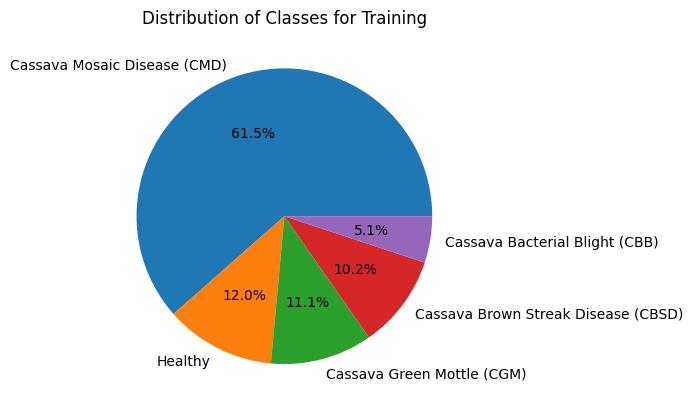

In [8]:
class_count.plot(kind='pie', autopct='%1.1f%%')
plt.title('Distribution of Classes for Training')
plt.ylabel('')
plt.show()

# Creating Dataframe for Testing

In [9]:
test_class_labels = []

for item in os.listdir(cassava_test_dir):
    all_images = os.listdir(cassava_test_dir+"/"+item)

# print(all_images)


    for image in all_images:
        test_class_labels.append(
            (item,
             str(cassava_test_dir+"/"+item+"/"+image)
        )
        )
# print(test_class_labels)

In [10]:
test_df = pd.DataFrame(
    data=test_class_labels,
    columns=[
        "label",
        "image"
    ])

test_df["label"].replace(
    ["Class0","Class1","Class2","Class3","Class4"],
    [0,1,2,3,4],
    inplace=True)

test_df

/tmp/ipykernel_102/434175560.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  test_df["label"].replace(
/tmp/ipykernel_102/434175560.py:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  test_df["label"].replace(


,label,image
0,1,/kaggle/input/cassava-leaf-disease-classificat...
1,1,/kaggle/input/cassava-leaf-disease-classificat...
2,1,/kaggle/input/cassava-leaf-disease-classificat...
3,1,/kaggle/input/cassava-leaf-disease-classificat...
4,1,/kaggle/input/cassava-leaf-disease-classificat...
...,...,...
2131,3,/kaggle/input/cassava-leaf-disease-classificat...
2132,3,/kaggle/input/cassava-leaf-disease-classificat...
2133,3,/kaggle/input/cassava-leaf-disease-classificat...
2134,3,/kaggle/input/cassava-leaf-disease-classificat...


In [11]:
test_df["class_name"] = test_df["label"].astype(str).map(mapped_classes)
test_df

,label,image,class_name
0,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
1,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
2,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
3,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
4,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
...,...,...,...
2131,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)
2132,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)
2133,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)
2134,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)


In [12]:
class_count = test_df["class_name"].value_counts()
print(class_count)

class_name
Cassava Mosaic Disease (CMD)           1315
Healthy                                 257
Cassava Green Mottle (CGM)              238
Cassava Brown Streak Disease (CBSD)     218
Cassava Bacterial Blight (CBB)          108
Name: count, dtype: int64


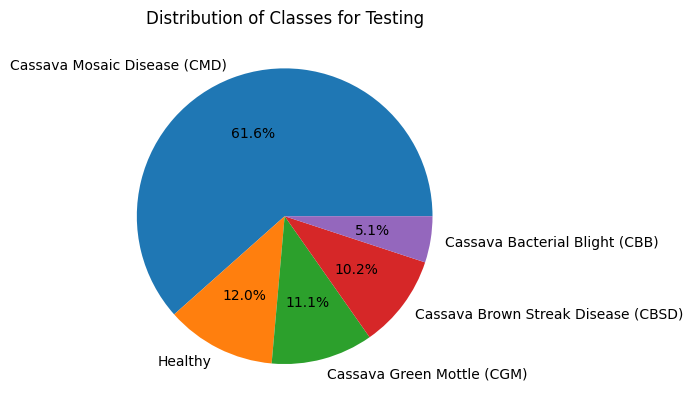

In [13]:
class_count.plot(kind='pie', autopct='%1.1f%%')
plt.title('Distribution of Classes for Testing')
plt.ylabel('')
plt.show()

# Creating Dataframe for validation

In [14]:
val_class_labels = []

for item in os.listdir(cassava_val_dir):
    all_images = os.listdir(cassava_val_dir+"/"+item)

# print(all_images)


    for image in all_images:
        val_class_labels.append(
            (item,
             str(cassava_val_dir+"/"+item+"/"+image)
        )
        )
# print(val_class_labels)

In [15]:
val_df = pd.DataFrame(
    data=val_class_labels,
    columns=[
        "label",
        "image"
    ])

val_df["label"].replace(
    ["Class0","Class1","Class2","Class3","Class4"],
    [0,1,2,3,4],
    inplace=True)

val_df

/tmp/ipykernel_102/1391281796.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  val_df["label"].replace(
/tmp/ipykernel_102/1391281796.py:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  val_df["label"].replace(


,label,image
0,1,/kaggle/input/cassava-leaf-disease-classificat...
1,1,/kaggle/input/cassava-leaf-disease-classificat...
2,1,/kaggle/input/cassava-leaf-disease-classificat...
3,1,/kaggle/input/cassava-leaf-disease-classificat...
4,1,/kaggle/input/cassava-leaf-disease-classificat...
...,...,...
2131,3,/kaggle/input/cassava-leaf-disease-classificat...
2132,3,/kaggle/input/cassava-leaf-disease-classificat...
2133,3,/kaggle/input/cassava-leaf-disease-classificat...
2134,3,/kaggle/input/cassava-leaf-disease-classificat...


In [16]:
val_df["class_name"] = val_df["label"].astype(str).map(mapped_classes)
val_df

,label,image,class_name
0,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
1,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
2,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
3,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
4,1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
...,...,...,...
2131,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)
2132,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)
2133,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)
2134,3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)


In [17]:
class_count = val_df["class_name"].value_counts()
print(class_count)

class_name
Cassava Mosaic Disease (CMD)           1315
Healthy                                 257
Cassava Green Mottle (CGM)              238
Cassava Brown Streak Disease (CBSD)     218
Cassava Bacterial Blight (CBB)          108
Name: count, dtype: int64


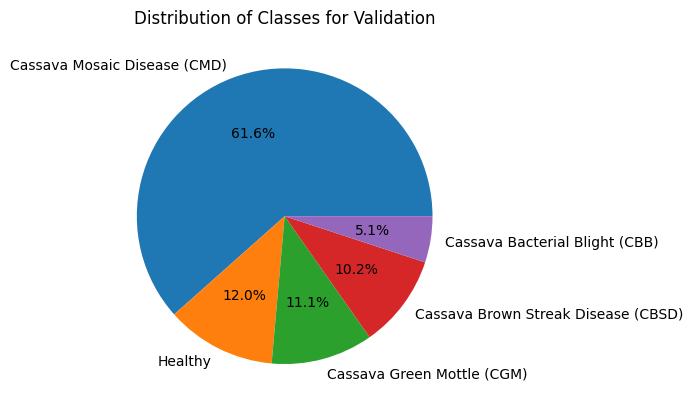

In [18]:
class_count.plot(kind='pie', autopct='%1.1f%%')
plt.title('Distribution of Classes for Validation')
plt.ylabel('')
plt.show()

# Displaying Images from the Each Class of the Training Images

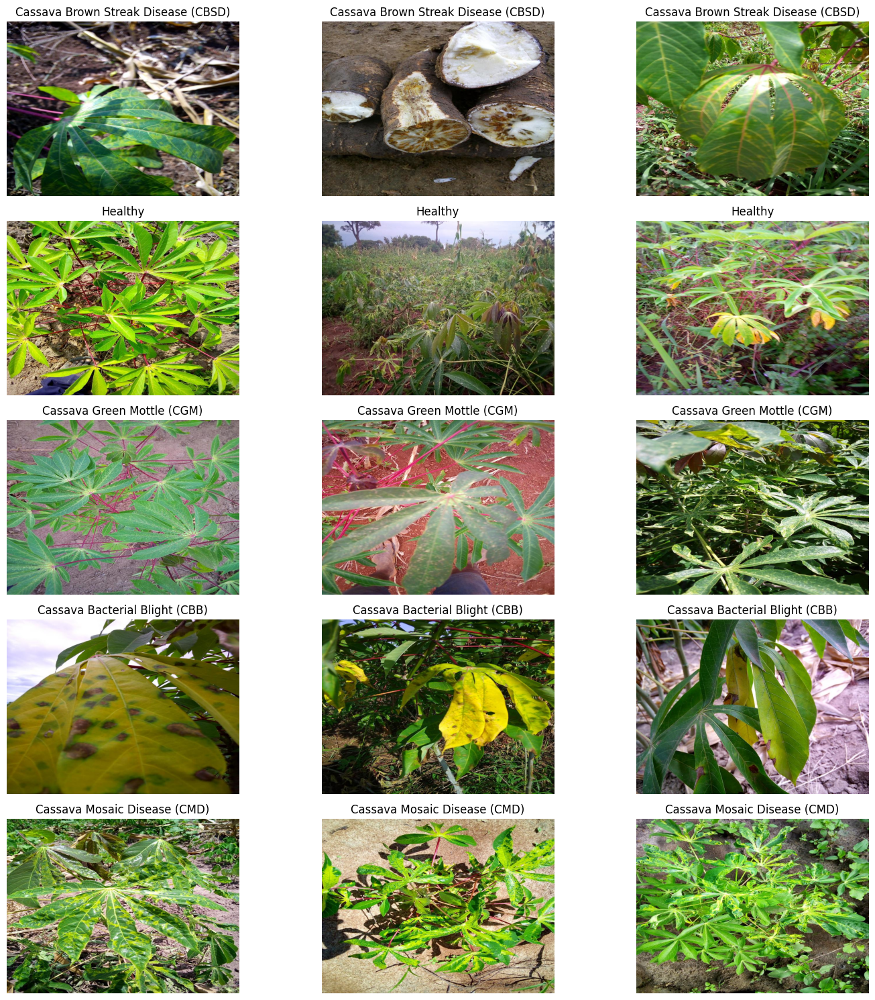

In [19]:
# Number of images to show per class
num_images_per_class = 3

# Assuming train_df is already loaded with columns: ['label', 'image', 'class_name']
unique_classes = train_df['class_name'].unique()

plt.figure(figsize=(15, len(unique_classes) * 3))

image_index = 1

for class_name in unique_classes:
    # Filter dataframe for this class
    class_subset = train_df[train_df['class_name'] == class_name].head(num_images_per_class)
    
    for _, row in class_subset.iterrows():
        img_path = row['image']
        
        # Load image using cv2 and convert BGR to RGB
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Plot the image
        plt.subplot(len(unique_classes), num_images_per_class, image_index)
        plt.imshow(img)
        plt.axis('off')
        plt.title(class_name)
        
        image_index += 1

plt.tight_layout()
plt.show()

# Image Preprocessing
    * Image Masking 
    * Image Segmentation 
    * Image Deskewing 
    * Greyscale Conversion 
    * Threshold Operation 
    * Noise Removal 
    * Canny Edge 
    * Detection Image Sharpening


In [70]:
def create_mask_for_image(images):
    
    output_images = []
    
    for image in images:
        image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

        lower_hsv = np.array([0,0,250])
        upper_hsv = np.array([250,255,255])
        
        mask = cv2.inRange(image_hsv, lower_hsv, upper_hsv)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11,11))
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
        
        output_images.append(mask)

    return output_images

def segment_image(images):

    output_images = []
    masked_images = create_mask_for_image(images)
    
    for (image,mask) in zip(images,masked_images):
        
        output = cv2.bitwise_and(image, image, mask=mask)
        output_images.append(output)
    
    return output_images

def deskew_image(images):

    output_images = []

    for image in images:
        
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        coords = np.column_stack(np.where(gray > 0))
        angle = cv2.minAreaRect(coords)[-1]
        
        if angle < -45:
            angle = -(90 + angle)
        else:
            angle = -angle
        
        (h, w) = image.shape[:2]
        center = (w // 2, h // 2)
        
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
        
        output_images.append(rotated)
        
    return output_images

def gray_image(images):

    output_images = []

    for image in images:
        output_images.append(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))

    return output_images

def thresh_image(images):
    output_images = []

    for image in images:
        # Convert float32 to uint8 if needed
        if image.dtype != np.uint8:
            image = (image * 255).astype(np.uint8)

        # Apply Otsu's thresholding
        _, thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        output_images.append(thresh)

    return output_images

def rnoise_image(images):

    output_images = []
    kernel = np.ones((3,3), np.uint8)
    
    for image in images:
        output_images.append(cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel, iterations=1))
        
    return output_images

def canny_image(images):

    output_images = []
    
    for image in images:
        output_images.append(cv2.Canny(image, 100, 200))
        
    return output_images 

def sharpen_image(images):

    output_images = []
    
    for image in images:
        image_blurred = cv2.GaussianBlur(image, (0, 0), 3)
        image_sharp = cv2.addWeighted(image, 1.5, image_blurred, -0.5, 0)
        output_images.append(image_sharp)
        
    return output_images

In [21]:
def preprocess(directory):
    '''
    Return the standardized format of all the 
    images in a given directory (ex: 'train', 'test', 'valid')
    '''
    image_files = list(paths.list_images(directory))
    arrays, labels = [], []

    for img in image_files:
        label = os.path.basename(os.path.dirname(img))  # label = folder name
        image = cv2.imread(img)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (224, 224))
        arrays.append(image)
        labels.append(label)

    return np.array(arrays, dtype="float32"), np.array(labels)

In [22]:
#a placeholder for training data and the training labels
train_data, train_labels = preprocess(train_dir)
#a placeholder for validation (dev) data and the validation (dev) labels
valid_data, valid_labels = preprocess(valid_dir)
#a placeholder for test data and the test labels
test_data, test_labels = preprocess(test_dir)

In [24]:
temp_images = train_data[2:11]
temp_classes = train_labels[2:11]

# Image Masking

In [33]:
masked_images = create_mask_for_image(temp_images)

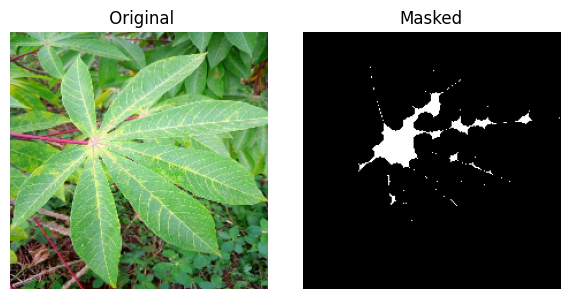

In [100]:
idx = 3  # show image at index 3

original = temp_images[idx].astype(np.uint8)
masked = masked_images[idx]
class_name = temp_classes[idx]

plt.figure(figsize=(6, 3))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.axis('off')
plt.title(' Original')

# Thresholded image
plt.subplot(1, 2, 2)
plt.imshow(masked, cmap='gray')
plt.axis('off')
plt.title('Masked')

plt.tight_layout()
plt.show()

# Image Segmentation

In [102]:
segmented_images = segment_image(temp_images)

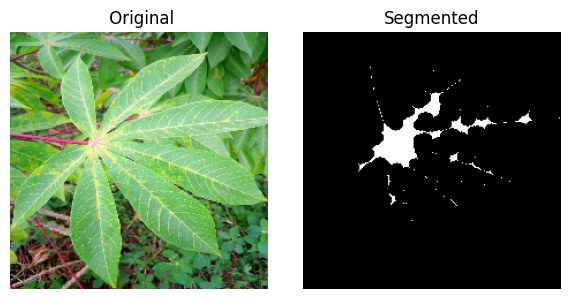

In [99]:
idx = 3  # show image at index 3

original = temp_images[idx].astype(np.uint8)
segmented = segmented_images[idx]
class_name = temp_classes[idx]

plt.figure(figsize=(6, 3))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.axis('off')
plt.title(' Original')

# Thresholded image
plt.subplot(1, 2, 2)
plt.imshow(segmented, cmap='gray')
plt.axis('off')
plt.title('Segmented')

plt.tight_layout()
plt.show()

# Image Deskewing

In [62]:
deskewed_images = deskew_image(segmented_images)

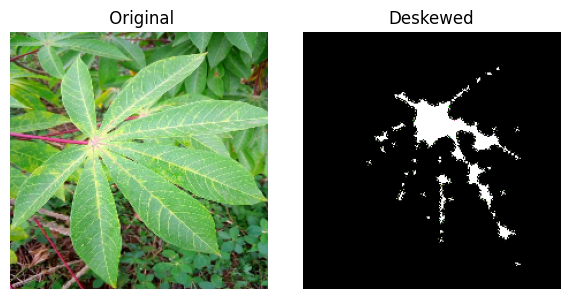

In [98]:
idx = 3  # show image at index 3

original = temp_images[idx].astype(np.uint8)
deskewed = deskewed_images[idx]
class_name = temp_classes[idx]

plt.figure(figsize=(6, 3))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.axis('off')
plt.title(' Original')

# Thresholded image
plt.subplot(1, 2, 2)
plt.imshow(deskewed, cmap='gray')
plt.axis('off')
plt.title('Deskewed')

plt.tight_layout()
plt.show()

# Greyscale Conversion 

In [66]:
grayed_images = gray_image(deskewed_images)

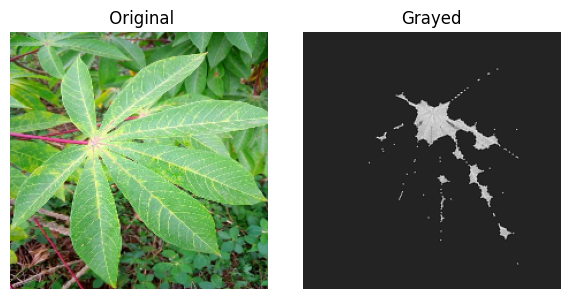

In [97]:
idx = 3  # show image at index 3

original = temp_images[idx].astype(np.uint8)
grayed = grayed_images[idx]
class_name = temp_classes[idx]

plt.figure(figsize=(6, 3))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.axis('off')
plt.title(' Original')

# Thresholded image
plt.subplot(1, 2, 2)
plt.imshow(grayed, cmap='gray')
plt.axis('off')
plt.title('Grayed')

plt.tight_layout()
plt.show()

# Threshold Operation 

In [71]:
thresholded_images = thresh_image(grayed_images)

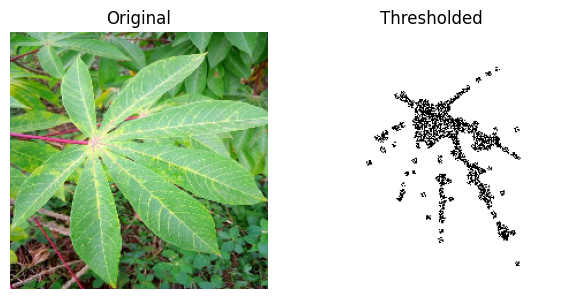

In [95]:
idx = 3  # show image at index 3

original = temp_images[idx].astype(np.uint8)
threshed = thresholded_images[idx]
class_name = temp_classes[idx]

plt.figure(figsize=(6, 3))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.axis('off')
plt.title('Original')

# Thresholded image
plt.subplot(1, 2, 2)
plt.imshow(threshed, cmap='gray')
plt.axis('off')
plt.title('Thresholded')

plt.tight_layout()
plt.show()

# Noise Removal 

In [103]:
r_noise_images = rnoise_image(thresholded_images)

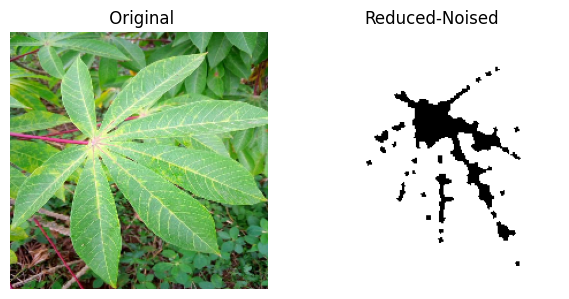

In [104]:
idx = 3  # show image at index 3

original = temp_images[idx].astype(np.uint8)
r_noised = r_noise_images[idx]
class_name = temp_classes[idx]

plt.figure(figsize=(6, 3))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.axis('off')
plt.title(' Original')

# Thresholded image
plt.subplot(1, 2, 2)
plt.imshow(r_noised, cmap='gray')
plt.axis('off')
plt.title('Reduced-Noised')

plt.tight_layout()
plt.show()

# Canny Edge Detection 

In [105]:
canny_images = canny_image(r_noise_images)

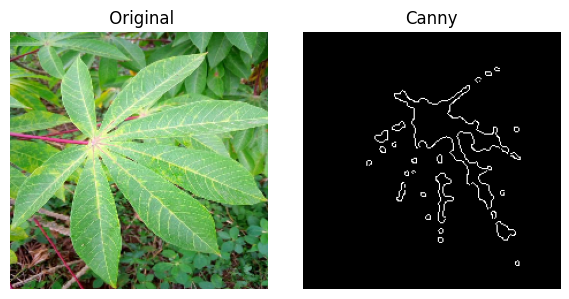

In [106]:
idx = 3  # show image at index 3

original = temp_images[idx].astype(np.uint8)
canny = canny_images[idx]
class_name = temp_classes[idx]

plt.figure(figsize=(6, 3))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.axis('off')
plt.title(' Original')

# Thresholded image
plt.subplot(1, 2, 2)
plt.imshow(canny, cmap='gray')
plt.axis('off')
plt.title('Canny')

plt.tight_layout()
plt.show()

# Image Sharpening

In [107]:
sharpened_images = sharpen_image(canny_images)

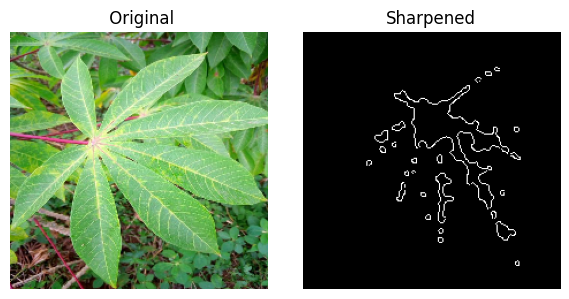

In [108]:
idx = 3  # show image at index 3

original = temp_images[idx].astype(np.uint8)
sharpened = sharpened_images[idx]
class_name = temp_classes[idx]

plt.figure(figsize=(6, 3))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.axis('off')
plt.title(' Original')

# Thresholded image
plt.subplot(1, 2, 2)
plt.imshow(sharpened, cmap='gray')
plt.axis('off')
plt.title('Sharpened')

plt.tight_layout()
plt.show()

In [27]:
Binarizer = LabelBinarizer()
train_y = Binarizer.fit_transform(train_labels)
valid_y = Binarizer.transform(valid_labels)
test_y = Binarizer.transform(test_labels)

In [6]:
#shuffling the training data
train_indx = np.arange(len(train_labels))
np.random.shuffle(train_indx)
train_data, train_y = train_data[train_indx], train_y[train_indx]

In [21]:
#rescaling the images such that the pixel values are between one and zero
train_data = train_data / 255.
valid_data = valid_data / 255.
test_data = test_data / 255.

# Image Augmentation

In [20]:
train_augment = ImageDataGenerator(
	rotation_range=30,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True,
	fill_mode="nearest")

valid_augment = ImageDataGenerator()

train_augment.fit(train_data)
valid_augment.fit(valid_data)

# Model Training

In [110]:
baseModel = InceptionV3(weights="imagenet", include_top=False, input_shape = (224, 224, 3))
#Freeze the Inception V3 layers:
for layer in baseModel.layers:
	layer.trainable = False

x = baseModel.output
x = layers.GlobalMaxPooling2D()(x)
x = layers.Dense(512, activation="relu")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(5, activation="softmax")(x)

# Configure and compile the model
model = Model(baseModel.input, x)
optimizer = Adam(learning_rate=1e-4, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

model.summary()

I0000 00:00:1750020480.138856     102 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 111, 111, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 111, 111, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 111, 111, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 109, 109, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 109, 109, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 109, 109, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 109, 109, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 109, 109, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 109, 109, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 54, 54, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 54, 54, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 54, 54, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 54, 54, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 52, 52, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 52, 52, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 22,854,437 (87.18 MB)

 Trainable params: 1,051,653 (4.01 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [22]:
BATCH_SIZE = 16
EPOCHS = 4
STEPS_PER_EPOCH = train_data.shape[0] // BATCH_SIZE
VALIDATION_STEPS = valid_data.shape[0] // BATCH_SIZE

VALIDATION_DATA = valid_augment.flow(valid_data, valid_y)
TRAIN = train_augment.flow(train_data, train_y, batch_size = BATCH_SIZE)

history = model.fit(TRAIN,
                    epochs = EPOCHS, 
                    validation_data = VALIDATION_DATA,
                    verbose = 1, 
                    steps_per_epoch = STEPS_PER_EPOCH, 
                    validation_steps= VALIDATION_STEPS)

Epoch 1/4
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 197s 169ms/step - accuracy: 0.5653 - loss: 1.4884 - val_accuracy: 0.6484 - val_loss: 0.9725
Epoch 2/4
   1/1069 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - accuracy: 0.5625 - loss: 1.0155

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


1069/1069 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5625 - loss: 1.0155 - val_accuracy: 0.6479 - val_loss: 0.9720
Epoch 3/4
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 171s 160ms/step - accuracy: 0.6402 - loss: 1.0251 - val_accuracy: 0.6671 - val_loss: 0.9177
Epoch 4/4
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.6875 - loss: 0.8197 - val_accuracy: 0.6690 - val_loss: 0.9172


In [23]:
for layer in baseModel.layers:
    layer.trainable = True

optimizer = Adam(learning_rate=1e-4, beta_1=0.9, beta_2=0.999, amsgrad=True)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['acc'])

checkpoint_cb = ModelCheckpoint("/kaggle/working/leaf_model/Cassava_Model_InceptionV3.keras",
                                    save_best_only=True,
                                    monitor = 'val_acc',
                                    mode='max')

learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', patience=5, verbose=1, factor=0.5, 
                                            min_lr=0.000001, cooldown=2)
early_stopping = EarlyStopping(
    monitor='val_acc', 
    verbose=1,
    patience=5,
    mode='max',
    restore_best_weights=True)

In [24]:
BATCH_SIZE = 16
EPOCHS = 100

history = model.fit(TRAIN,
                    epochs = EPOCHS, 
                    validation_data = VALIDATION_DATA,
                    verbose = 1, 
                    steps_per_epoch = STEPS_PER_EPOCH, 
                    validation_steps = VALIDATION_STEPS, 
                    callbacks = [checkpoint_cb, learning_rate_reduction, early_stopping])

model.save("/kaggle/working/leaf_model/Cassava_Model_InceptionV3.keras")

Epoch 1/100
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 311s 208ms/step - acc: 0.6546 - loss: 0.9692 - val_acc: 0.7308 - val_loss: 0.7222 - learning_rate: 1.0000e-04
Epoch 2/100
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - acc: 0.6875 - loss: 0.7407 - val_acc: 0.7350 - val_loss: 0.7182 - learning_rate: 1.0000e-04
Epoch 3/100
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 185s 173ms/step - acc: 0.7498 - loss: 0.7026 - val_acc: 0.7734 - val_loss: 0.6087 - learning_rate: 1.0000e-04
Epoch 4/100
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - acc: 0.9375 - loss: 0.4042 - val_acc: 0.7715 - val_loss: 0.6110 - learning_rate: 1.0000e-04
Epoch 5/100
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 183s 171ms/step - acc: 0.7831 - loss: 0.6190 - val_acc: 0.7968 - val_loss: 0.5609 - learning_rate: 1.0000e-04
Epoch 6/100
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - acc: 0.8750 - loss: 0.5858 - val_acc: 0.7954 - val_loss: 0.5628 - learning_rate: 1.0000e-04
Epoch 7/100
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 181s 170ms/step - acc: 0.8048 - loss: 0.5520 - val_

# Model Testing

In [22]:
model = load_model("/kaggle/working/leaf_model/Cassava_Model_InceptionV3.keras")
y_pred = model.predict(test_data)

67/67 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step


In [23]:
import numpy as np

# Convert predictions and true labels from one-hot to class indices
true_labels = test_y.argmax(axis=1)
predicted_labels = y_pred.argmax(axis=1)

# Compute accuracy
accuracy = np.mean(true_labels == predicted_labels)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

Test Accuracy: 83.15%


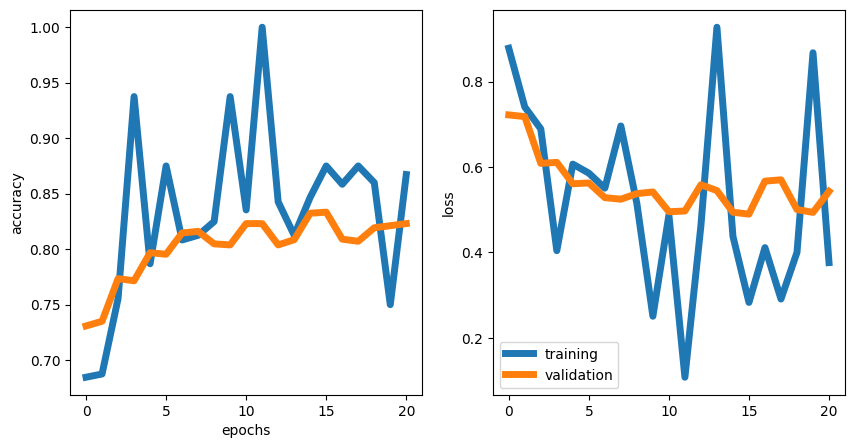

In [26]:
fig, axs = plt.subplots(nrows = 1, ncols =2 , figsize = (10,5))
axs[0].plot(range(len(history.history['acc'])), history.history['acc'], linewidth = 5, label = "training")
axs[0].plot(range(len(history.history['acc'])), history.history['val_acc'], linewidth = 5, label = "validation")
axs[1].plot(range(len(history.history['loss'])), history.history['loss'], linewidth = 5, label = "training")
axs[1].plot(range(len(history.history['loss'])), history.history['val_loss'], linewidth = 5, label = "validation")
axs[0].set_xlabel("epochs")
axs[0].set_xlabel("epochs")
axs[0].set_ylabel("accuracy")
axs[1].set_ylabel("loss")
plt.legend()

In [27]:
unique_labels = Binarizer.inverse_transform(np.eye(5))
report = classification_report(test_y.argmax(axis = 1), 
                      y_pred.argmax(axis = 1), 
                      labels = [0,1,2,3,4], 
                      target_names = unique_labels)

In [28]:
print(report)

              precision    recall  f1-score   support

      Class0       0.60      0.54      0.57       108
      Class1       0.72      0.74      0.73       218
      Class2       0.81      0.52      0.63       238
      Class3       0.93      0.95      0.94      1315
      Class4       0.58      0.74      0.65       257

    accuracy                           0.83      2136
   macro avg       0.73      0.70      0.70      2136
weighted avg       0.84      0.83      0.83      2136



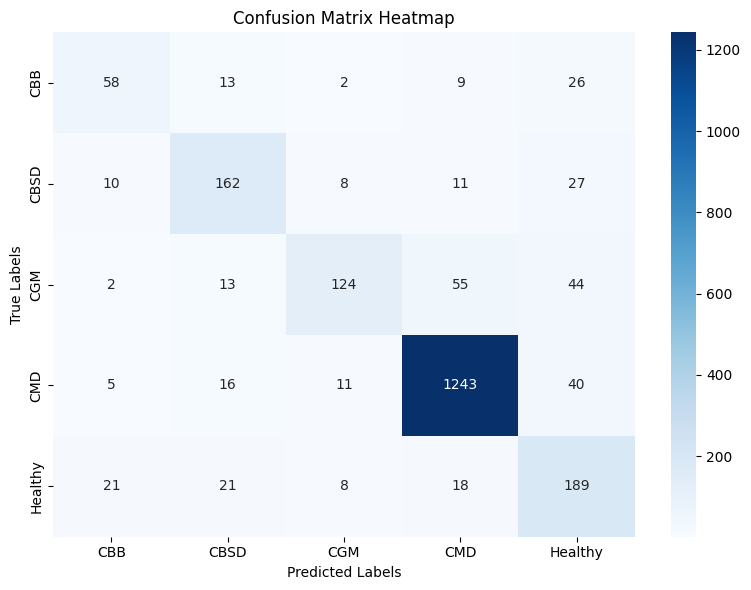

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cm = confusion_matrix(test_y.argmax(axis=1), y_pred.argmax(axis=1))

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['CBB', 'CBSD', 'CGM', 'CMD', 'Healthy'], yticklabels=['CBB', 'CBSD', 'CGM', 'CMD', 'Healthy'])

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.tight_layout()
plt.show()

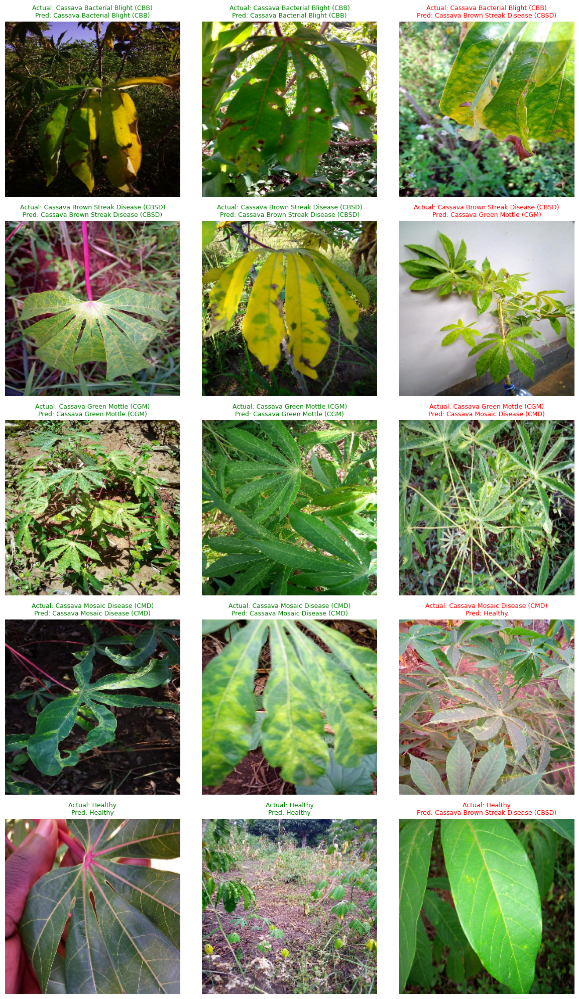

In [34]:
import matplotlib.pyplot as plt
import numpy as np

true_classes = test_y.argmax(axis=1)
pred_classes = y_pred.argmax(axis=1)

label_names = [
    "Cassava Bacterial Blight (CBB)",     
    "Cassava Brown Streak Disease (CBSD)",
    "Cassava Green Mottle (CGM)",         
    "Cassava Mosaic Disease (CMD)",       
    "Healthy"                             
]

samples_correct = 2
samples_incorrect = 1
total_samples = samples_correct + samples_incorrect

plt.figure(figsize=(total_samples * 4, len(label_names) * 4))
plot_index = 1

for class_idx in range(len(label_names)):
    # Find correct and incorrect prediction indices for the class
    correct_indices = np.where((true_classes == class_idx) & (pred_classes == class_idx))[0]
    incorrect_indices = np.where((true_classes == class_idx) & (pred_classes != class_idx))[0]

    if len(correct_indices) < samples_correct or len(incorrect_indices) < samples_incorrect:
        print(f"Not enough samples for class {label_names[class_idx]}")
        continue

    selected_correct = np.random.choice(correct_indices, samples_correct, replace=False)
    selected_incorrect = np.random.choice(incorrect_indices, samples_incorrect, replace=False)

    selected_indices = np.concatenate([selected_correct, selected_incorrect])

    for idx in selected_indices:
        img = (test_data[idx] * 255).astype("uint8")
        actual = label_names[true_classes[idx]]
        predicted = label_names[pred_classes[idx]]
        color = "green" if true_classes[idx] == pred_classes[idx] else "red"

        plt.subplot(len(label_names), total_samples, plot_index)
        plt.imshow(img)
        plt.title(f"Actual: {actual}\nPred: {predicted}", fontsize=9, color=color)
        plt.axis("off")
        plot_index += 1

plt.tight_layout()
plt.show()
